# MOFA-Flex & inflow (single slide)

In [73]:
import anndata as ad
import mudata as md
import numpy as np
import pandas as pd
import mofaflex as mfl
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from umap import UMAP
from pathlib import Path
import warnings
from anndata._warnings import ImplicitModificationWarning
warnings.filterwarnings(
    "ignore",
    category=ImplicitModificationWarning
)

### Load Multiome data object

In [2]:
data_path  = Path("data/MERFISH_mouse_brain/")
mdata = md.read_h5mu(data_path / "mdata_C57BL6J_2.039.h5mu")

/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/mudata/_core/mudata.py:1461: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


# Run MOFA-Flex

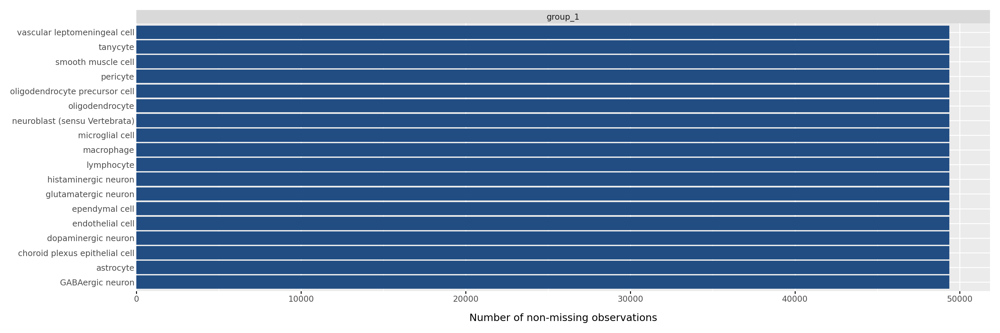

WARNING	Sparse arrays are currently not supported by Dask. Dask will not be used and data arrays may be copied, resulting in high memory usage.
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/mudata/_core/mudata.py:1461: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site

  0%|                                                                                                         …

/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/linear_operator/utils/interpolation.py:71: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at /pytorch/torch/csrc/tensor/python_tensor.cpp:78.)
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/linear_operator/utils/interpolation.py:71: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:653.)
INFO	Training converged after 443 epochs.
/g/stegle/aalsayah/Miniforge3/envs/mofa_flex/lib/python3.11/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_opti

In [3]:
model = mfl.MOFAFLEX(
    mdata,
    mfl.DataOptions(covariates_obsm_key="X_spatial_coords"),
    mfl.ModelOptions(
        n_factors=10,
        factor_prior="GP",
        likelihoods="Normal",
        weight_prior="SnS",
        nonnegative_factors=True,
        nonnegative_weights=True
    ),
    mfl.TrainingOptions(
        batch_size=2000,
        n_particles=10,
        lr=0.005,
        max_epochs=1000,
        save_path=str("model_sns_gp_C57BL6J_2.039.hdf5"),
        early_stopper_patience=50,
    ),
)

# Model Overview

In [2]:
#Load mofa model
model = mfl.MOFAFLEX.load("model_sns_gp_C57BL6J_2.039.hdf5")

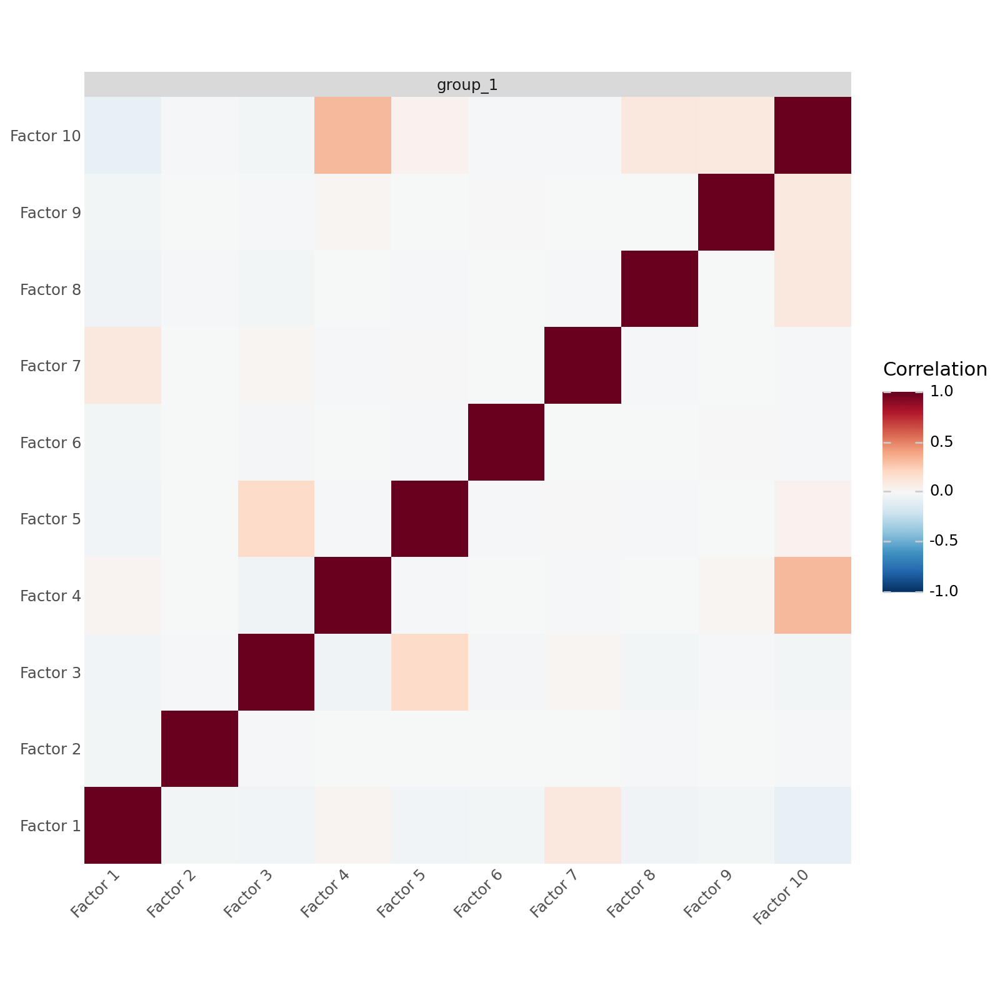

In [3]:
#Factor correlation
mfl.pl.factor_correlation(model)

### variance_explained

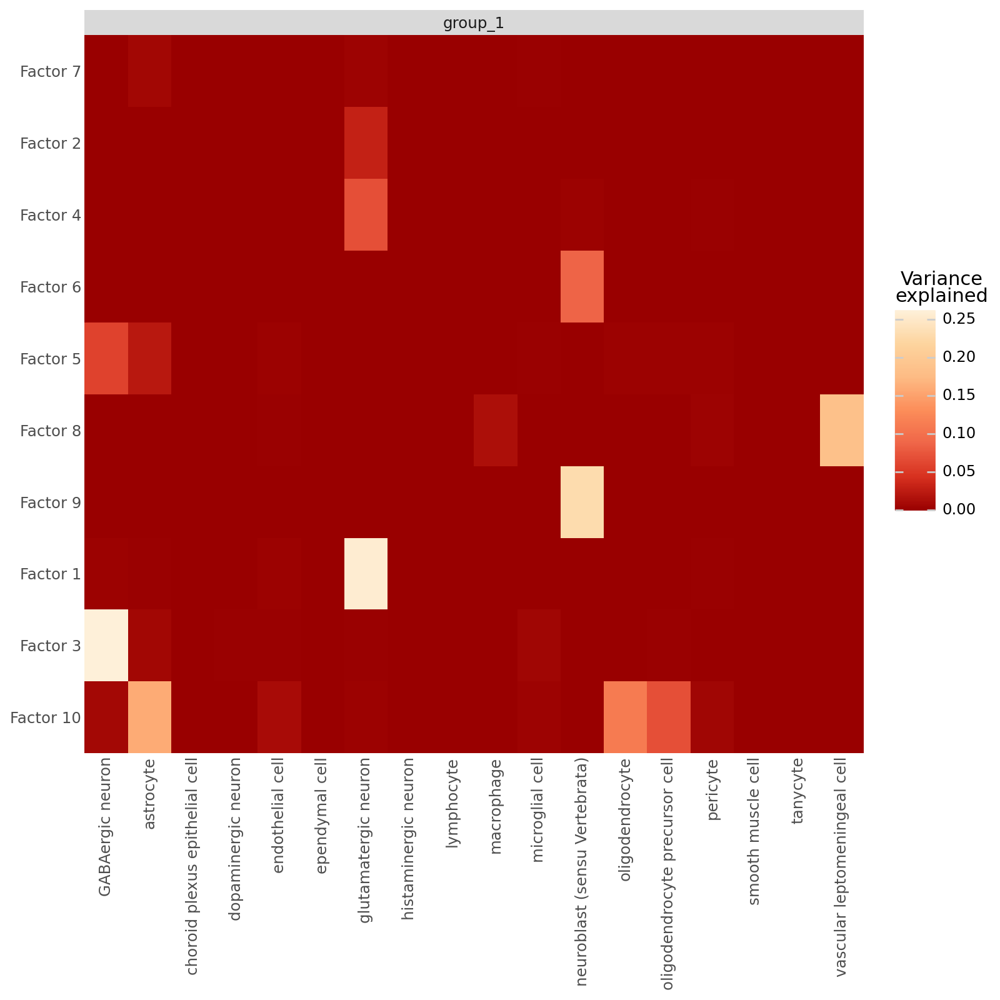

In [4]:
mfl.pl.variance_explained(model, figsize= (8,8))

### Interpretation of MOFA-Flex Factors Across Views <br>

Here, each MOFA-Flex view corresponds to a sender cell type, representing a source of ligand-mediated signaling. The inferred latent factors therefore capture coordinated patterns of variation in ligand–receptor (LR) signaling across cell-type–specific views.

Factors that are shared across multiple views likely represent global or conserved signaling programs. These factors most plausibly capture variability driven by common ligand–receptor interactions, or by individual ligands or receptors that are active across multiple sender cell types.

In contrast, factors that are specific to a single view capture signaling variability that is predominantly driven by one sender cell type. Such view-specific factors likely reflect cell-type–restricted interaction programs, where a particular cell type acts as the primary source of the signaling signal.

To further characterize the biological and spatial relevance of the inferred factors, we will performe the following downstream analyses:

**1. Explore top signals driving each factor.** <br>

**2. Spatial localization of factors.** <br>
We will explore the spatial distribution of factor activity to identify regionally localized or spatially structured signaling programs. <br>

**3. Factor enrichment across brain regions. <br>**
We will quanty factor enrichment across annotated brain regions to determine any region-specific signaling patterns.


**4. Factors - receiver cell types relationship.** <br>

**5. Spatial distribution of ligand–receptor interactions for LR-associated factors.** <br>
For factors associated with specific ligand–receptor signaling, we will visualize the spatial inflow patterns of the corresponding ligands and receptors.

**6. Brain region correlations and signaling similarity.** <br>
We will explore the correlations between brain regions based on shared factor enrichment, to identofy regions that exhibit similar signaling programs.

**7. Prediction of brain regions from latent factors** <br>
We will evaluate whether the inferred factors can be used to predict brain region identity.

## Read lrdata object

In [5]:
data_path  = Path("data/MERFISH_mouse_brain/")
lrdata = sc.read_h5ad(data_path / "lrdata_C57BL6J_2.039.h5ad")

### Filtering and organizing informative latent factors

In [63]:
def filter_factors(model, r2_thresh=0.99):
    r2_df = model.get_r2()["group_1"]
    r2_sorted = r2_df.sum(axis=1).sort_values(ascending=False)

    if r2_thresh < 1.0:
        r2_thresh = (r2_sorted.cumsum() / r2_sorted.sum() < r2_thresh).sum() + 1

    return r2_sorted.iloc[: int(r2_thresh)].index

In [64]:
factor_adata = model.get_factors("anndata")["group_1"][:, filter_factors(model)]

In [65]:
# add global obs to factor_adata
shared_obs_names = factor_adata.obs_names.intersection(lrdata.obs_names)
factor_adata = factor_adata[factor_adata.obs_names.isin(shared_obs_names)]
lrdata = lrdata[lrdata.obs_names.isin(shared_obs_names)]
lrdata_obs = lrdata.obs.reindex(factor_adata.obs_names)

In [66]:
columns = ['major_brain_region', 'cell_type']
renamed_columns = {col: f"{col}_ori" for col in columns}
lrdata_s= lrdata.obs[columns].rename(columns=renamed_columns)

# Add the renamed columns to factor_adata.obs
factor_adata.obs = factor_adata.obs.join(lrdata_s)

### 1. Explore top 5 signals driving each factor: (highest absolute weights)

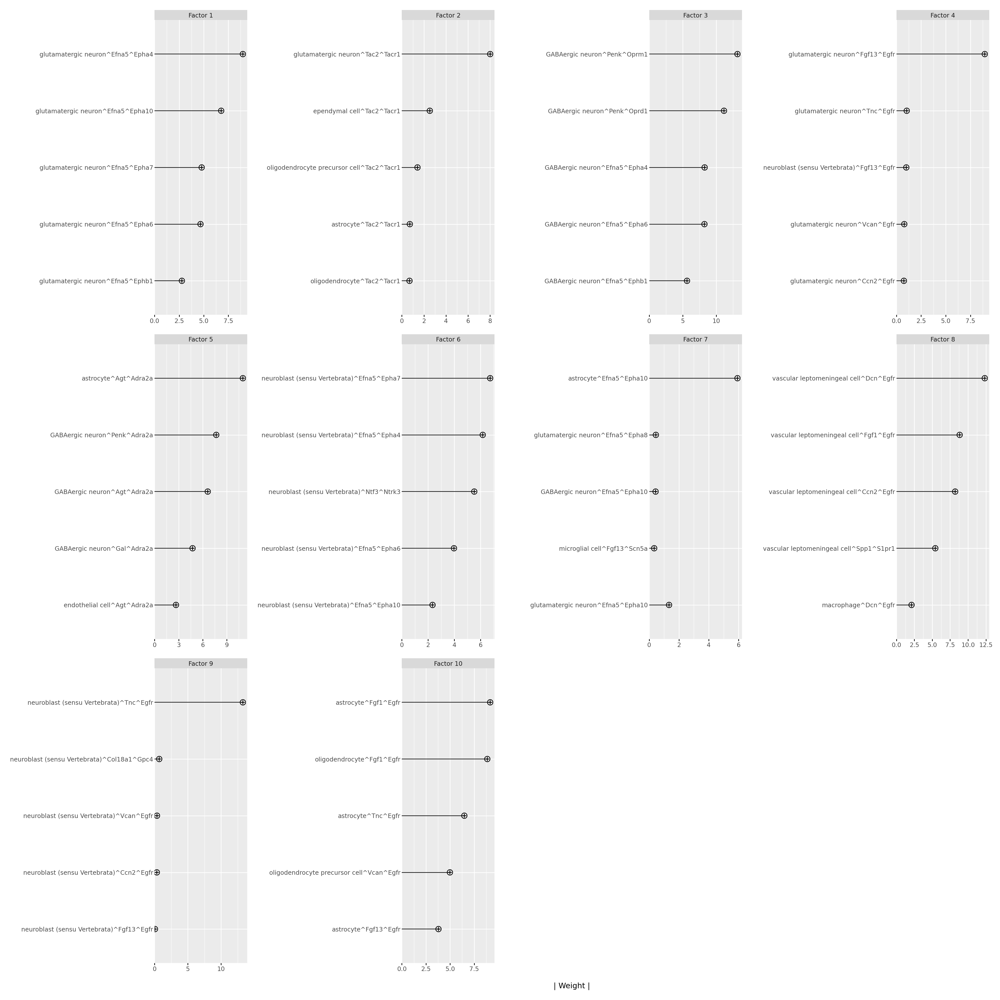

In [67]:
mfl.pl.top_weights(model, n_features=5, factors=None, figsize=(20, 20), nrow=None, ncol=None)

#### **Observations:** <br>
**Factors capturing source cell type–specific signaling:**
Several factors are predominantly driven by LR interactions originating from a single sender cell type, indicating cell-type–specific signaling programs:
1. **Factor 1** is primarily driven by signals originating from **glutamatergic neurons**.
2. **Factor 3** is dominated by signals sourced from **GABAergic neuron**.
3. **Factor 9 & 6** are mainly driven by **neuroblast (sensu vertebrata)**–derived signals.
4. **Factor 8** is dominated by signals sourced from **vascular leptomeningeal cells**.

**Factors capturing specific ligand–receptor pairs:**
Some factors are characterized by a single dominant ligand–receptor interaction across multiple sender cell types:

1. **Factor 2** is strongly driven by the **Tac2^Tacr1** ligand–receptor pair, suggesting a coherent signaling axis captured consistently across views.


**Factors capturing receptor-centric signaling programs:**
Other factors are defined primarily by a shared receptor, with ligands contributed by one or more sender cell types:

1. Factor 4 is dominated by signals received through **Egfr** receptor, with ligands mainly sourced from glutamatergic neurons.

2. Factor 5 captures signaling programs mediated by **Ara2a** receptor.

3. Factor 10 is also characterized by **Egfr**-mediated signaling, involving ligands expressed by multiple sender cell types.

Notably, **Factors 10 and 4** are positively correlated and both are mediated by EGFR signals.

### 2. Spatial localization of factors:

In [68]:
for key, arr in lrdata.obsm.items():
    factor_adata.obsm[key] = arr.copy()

In [69]:
factors = factor_adata.var_names.tolist()

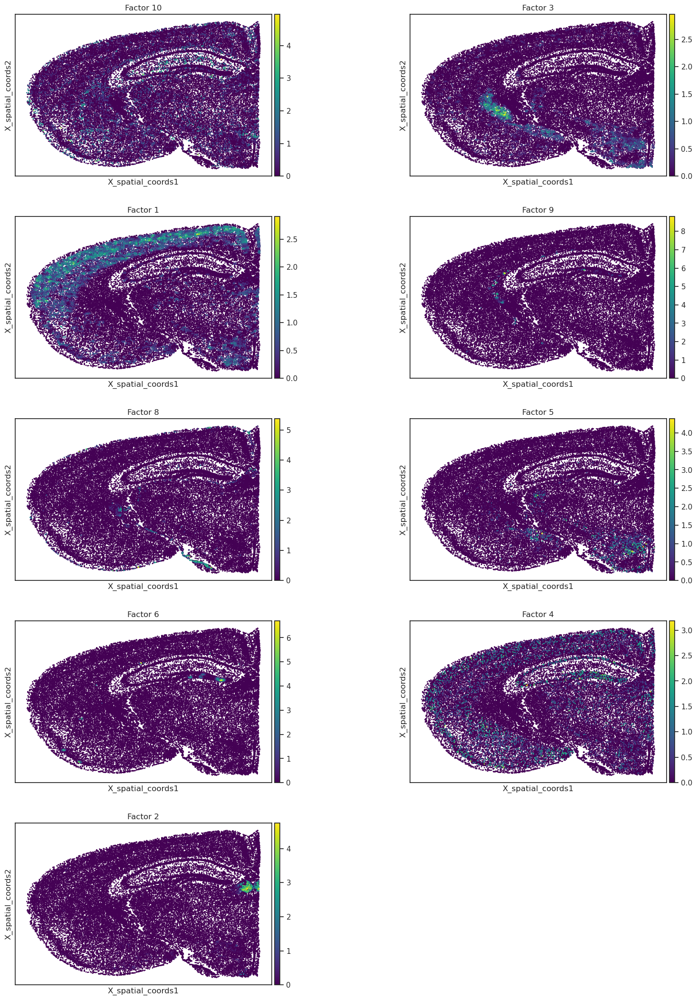

In [70]:
sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",         
    color=factors,     # list of metadata keys
    s=15,                            
    cmap='viridis',                 
    ncols=2,
    wspace=0.4,                       # space between subplots
    show=True
)

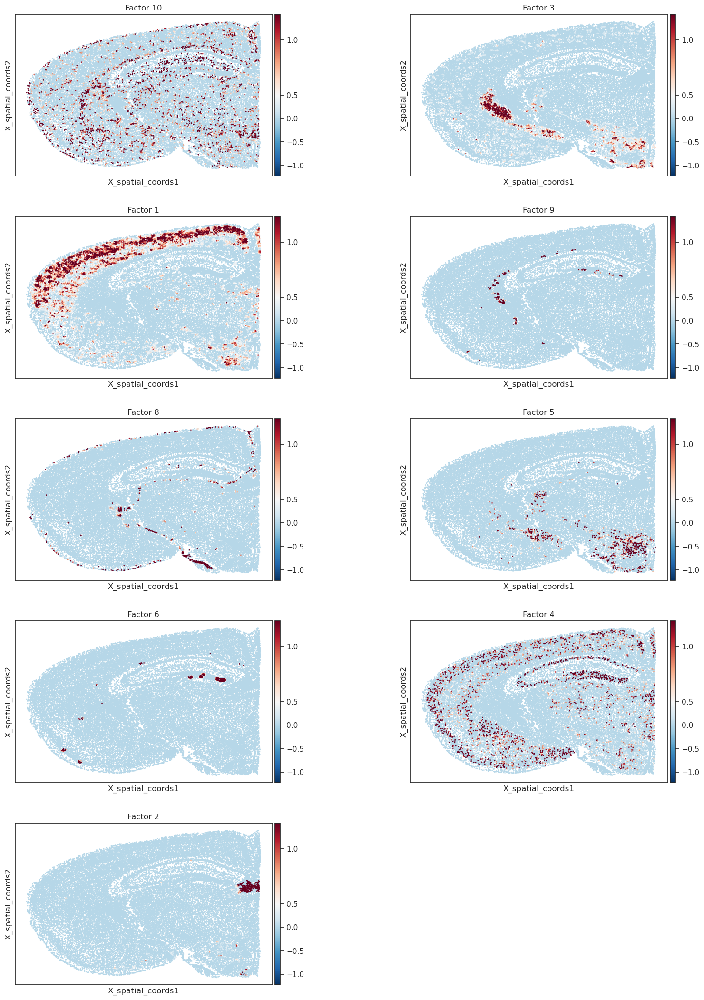

In [71]:
from matplotlib import colors

vals = np.hstack([factor_adata[:, f].X.flatten() for f in factors])
#avoid outliers (better for color scaling)
p_low, p_high = np.nanpercentile(vals, 1), np.nanpercentile(vals, 99)
absmax = max(abs(p_low), abs(p_high))

#make symmetric around 0.5
norm = colors.TwoSlopeNorm(vcenter=0.5, vmin=-absmax, vmax=absmax)

sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",
    color=factors,
    cmap="RdBu_r",
    norm=norm,
    s=15,
    ncols=2,
    wspace=0.4,
    show=True
)

**Observations:** <br>
Several factors exhibit clear spatial specificity: <br>

*  **Factor 8** shows strong enrichment at the tissue boundary.

* **Factor 3 & 5** showed positive correlation earlier, and highly similar spatial distributions. This overlap suggests that these factors capture related signaling programs.

* **Factor 2** show clear restriction to a discrete region of the tissue, maybe highly localized signaling program?


### 3. Factor enrichment across brain regions

We will explore factor activity across annotated major brain regions. This analysis identifies which brain regions are preferentially enriched for specific ligand–receptor–mediated communication.

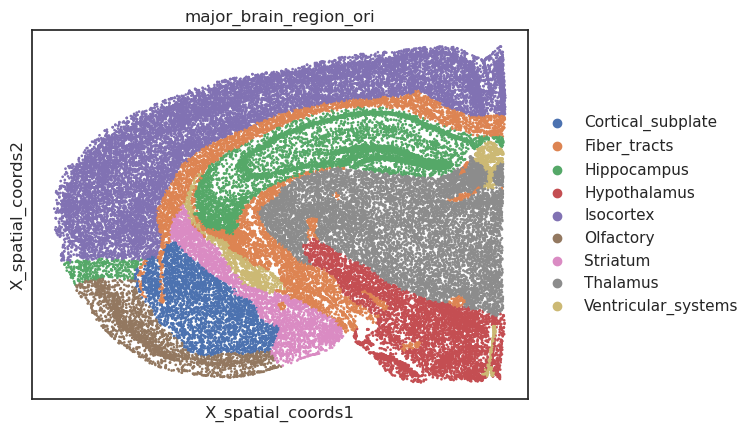

In [72]:
sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",         
    color="major_brain_region_ori",     # list of metadata keys
    s=15,                            
    cmap='viridis',                 
    ncols=2,
    wspace=0.4,                       # space between subplots
    show=True
)

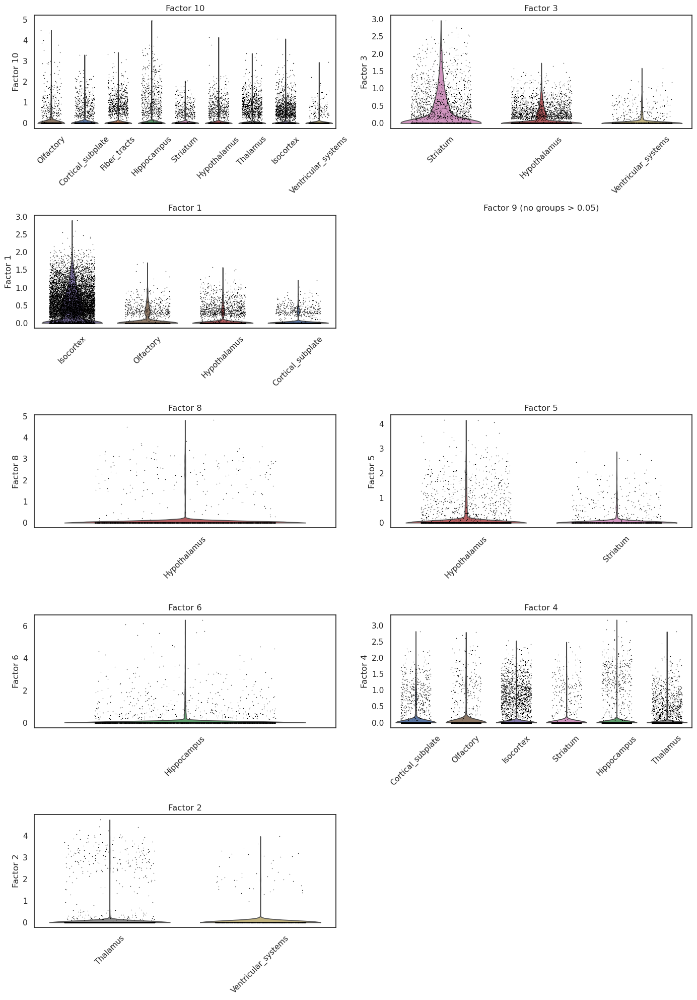

In [74]:
groupby ="major_brain_region_ori" 
threshold = 0.05

expr = pd.DataFrame(
    factor_adata.X,
    index=factor_adata.obs[groupby],
    columns=factor_adata.var_names
)


n_factors = len(factor_adata.var_names)
ncols = 2
nrows = int(np.ceil(n_factors / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 4 * nrows))
axes = axes.flatten()

for ax, factor in zip(axes, factor_adata.var_names):

    # Mean expression per group
    group_means = expr[factor].groupby(level=0, observed=False).mean()
    groups = group_means[group_means > threshold].index

    if len(groups) == 0:
        ax.set_title(f"{factor} (no groups > {threshold})")
        ax.axis("off")
        continue

    # Subset AnnData
    adata_sub = factor_adata[
        factor_adata.obs[groupby].isin(groups)
    ]

    # Optional: order groups by mean expression
    order = group_means.loc[groups].sort_values(ascending=False).index
    sc.pl.violin(
        adata_sub,
        keys=factor,
        groupby=groupby,
        order=order,
        ax=ax,
        show=False,
        stripplot=True,
        jitter=0.3
    )

    ax.set_title(factor)
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=45)

# Hide unused axes
for ax in axes[len(factor_adata.var_names):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

### 4. Factors - receiver cell types relationship

 To explore which cell populations are most responsive to the inferred signaling programs, we analyze the distribution of factor activity across receiver cell types. <br>
This analysis identifies cell types that preferentially show high factor scores, indicating enrichment for specific ligand–receptor–mediated signaling programs.

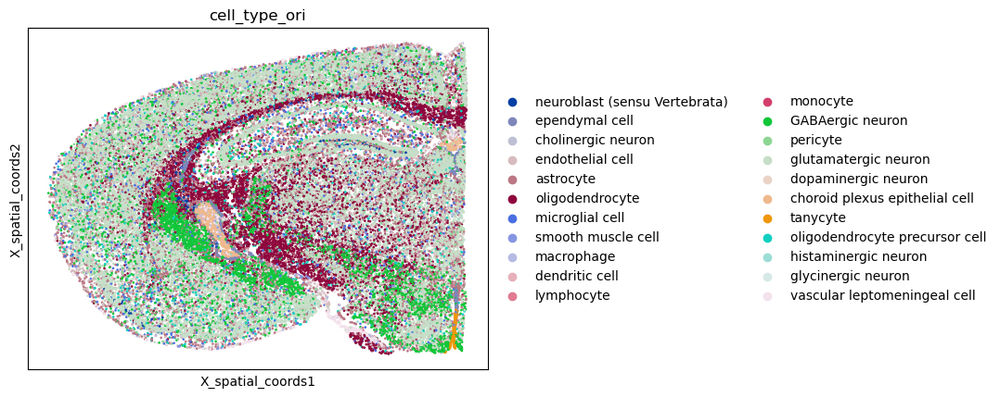

In [37]:
sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",         
    color="cell_type_ori",     # list of metadata keys
    s=15,                            
    cmap='viridis',                 
    ncols=2,
    wspace=0.4,                       # space between subplots
    show=True
)

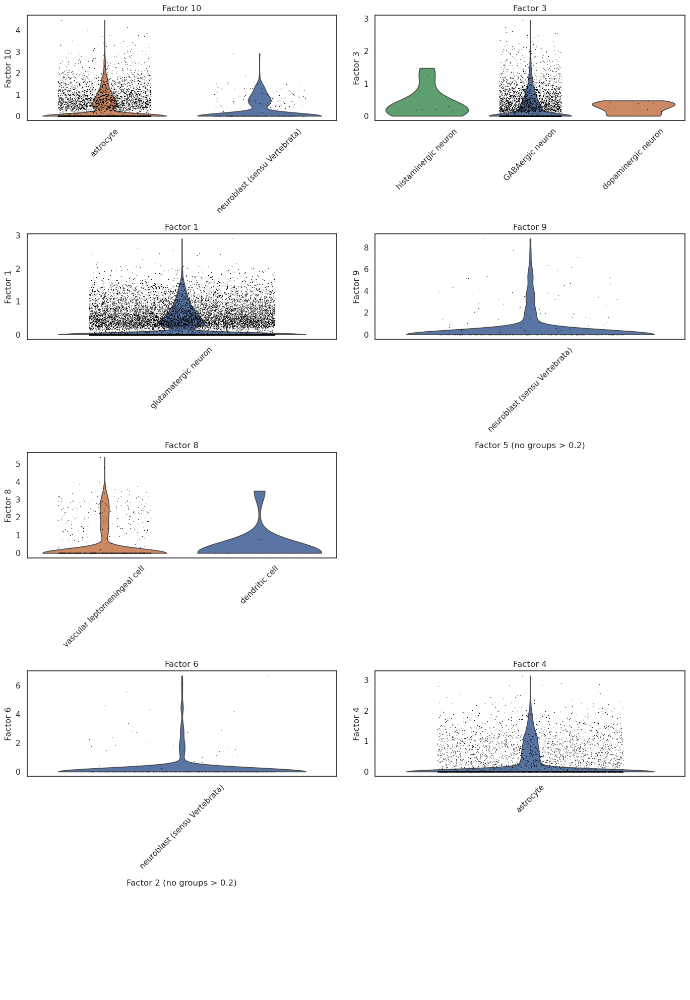

In [75]:
groupby ="cell_type_ori" 
threshold = 0.2

expr = pd.DataFrame(
    factor_adata.X,
    index=factor_adata.obs[groupby],
    columns=factor_adata.var_names
)


n_factors = len(factor_adata.var_names)
ncols = 2
nrows = int(np.ceil(n_factors / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 4 * nrows))
axes = axes.flatten()

for ax, factor in zip(axes, factor_adata.var_names):

    # Mean expression per group
    group_means = expr[factor].groupby(level=0, observed=False).mean()
    groups = group_means[group_means > threshold].index

    if len(groups) == 0:
        ax.set_title(f"{factor} (no groups > {threshold})")
        ax.axis("off")
        continue

    # Subset AnnData
    adata_sub = factor_adata[
        factor_adata.obs[groupby].isin(groups)
    ]

    # Optional: order groups by mean expression
    order = group_means.loc[groups].sort_values(ascending=False).index
    sc.pl.violin(
        adata_sub,
        keys=factor,
        groupby=groupby,
        order=order,
        ax=ax,
        show=False,
        stripplot=True,
        jitter=0.3
    )

    ax.set_title(factor)
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=45)

# Hide unused axes
for ax in axes[len(factor_adata.var_names):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

### 5. Spatial distribution of ligand–receptor interactions for LR-associated factors

To validate that ligand–receptor (LR)–associated factors, we explored the spatial distribution of LR inflow corresponding to the dominant interactions driving each factor. Specifically, we asked whether the spatial localization of individual LR pairs recapitulates the spatial pattern of the associated latent factor.

In [76]:
#Add source^L^R information to var_names
idx = pd.Series(lrdata.var_names, name="full").str.strip()
lrdata.var['LR'] = lrdata.var.index.to_series().astype(str).str.partition('^')[2]
lrdata.var['source_cell_type'] = lrdata.var.index.to_series().astype(str).str.partition('^')[0]
parts = idx.str.split("^", n=2, expand=True)
ligand = parts[1].str.strip()
receptor = parts[2].str.strip()
lrdata.var["ligand"] = ligand.values
lrdata.var["receptor"] = receptor.values

#### 5.1. Factor 2 captures Tac2–Tacr1 signaling exclusively:

Factor 2 is uniquely driven by the Tac2–Tacr1 ligand–receptor pair. <b>
To assess whether this interaction explains the spatial specificity of the factor, we visualized the spatial inflow of Tac2–Tacr1 across multiple sender cell types.

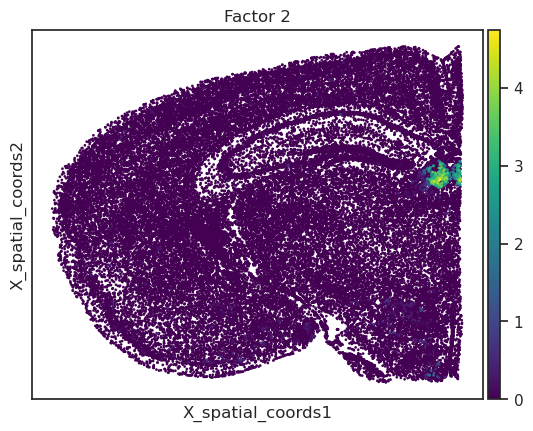

In [77]:
sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",         
    color="Factor 2",     # list of metadata keys
    s=15,                            
    cmap='viridis',                 
    ncols=2,
    wspace=0.4,                       # space between subplots
    show=True
)

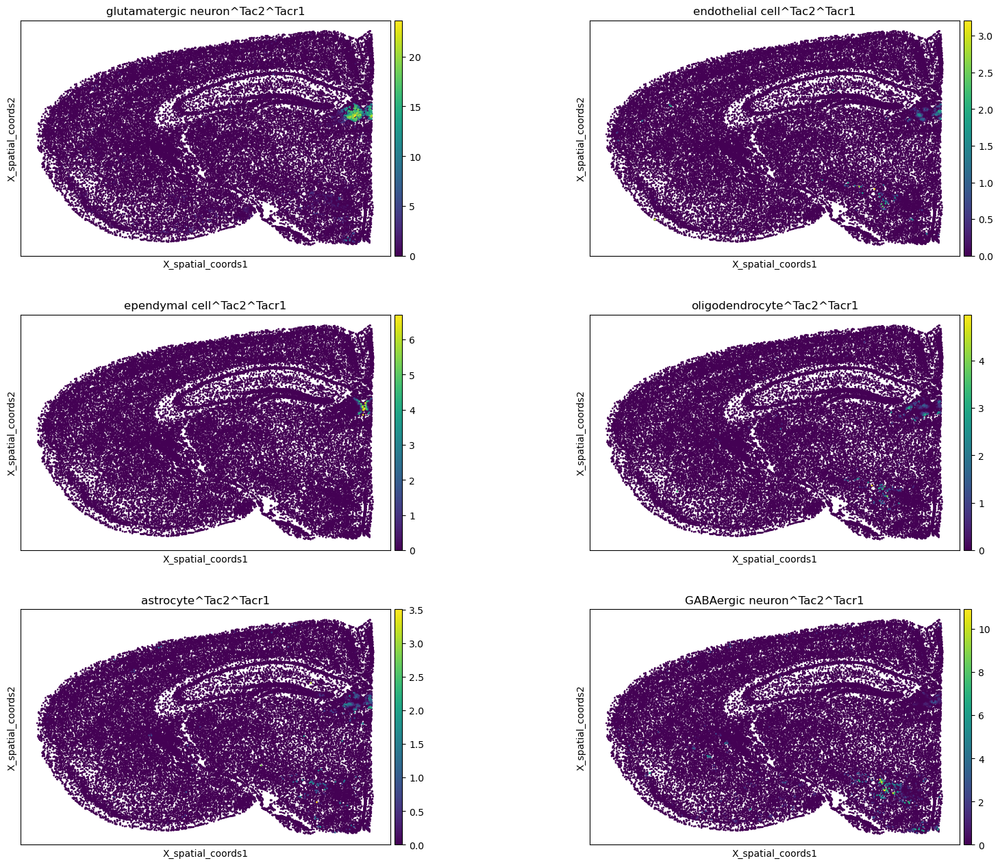

In [55]:
target = "Tac2^Tacr1"
features = lrdata.var_names[
    (lrdata.var['LR'] == target).values &
    (lrdata.X.mean(axis=0).A1 > 0.003)
]
sc.pl.embedding(
    lrdata,
    basis="X_spatial_coords",
    color=features,       
    s=15,
    cmap="viridis",
    ncols=2,
    wspace=0.4,
    show=True
)

This pattern closely matches the spatial localization of Factor 2.

#### 5.2. Factor 5 captures ADRA2A-mediated signaling across multiple ligands and sources

Factor 5 is characterized by signaling received through the ADRA2A receptor, with contributions from multiple ligands, including Penk and Agt, and originating from different sender cell types.

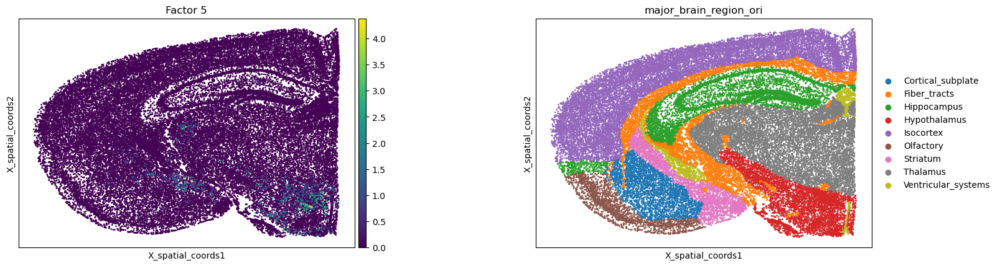

In [58]:
sc.pl.embedding(
    factor_adata,
    basis="X_spatial_coords",         
    color=["Factor 5", "major_brain_region_ori"],     # list of metadata keys
    s=15,                            
    cmap='viridis',                 
    ncols=2,
    wspace=0.4,                       # space between subplots
    show=True
)

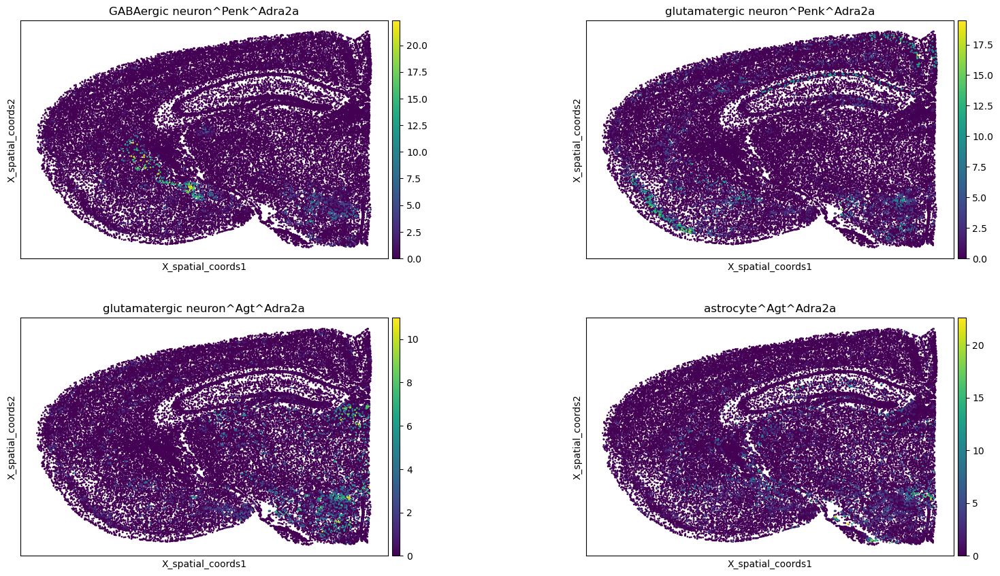

In [ ]:
target = "Adra2a"
features = lrdata.var_names[
    (lrdata.var['receptor'] == target).values &
    (lrdata.X.mean(axis=0).A1 > 0.1)
]
sc.pl.embedding(
    lrdata,
    basis="X_spatial_coords",
    color=features,       
    s=15,
    cmap="viridis",
    ncols=2,
    wspace=0.4,
    show=True
)

### 6. Brain region correlations and signaling similarity

To investigate similarities in signaling programs across anatomical regions, we will compute **pairwise Pearson correlations** between major brain regions based on their factor enrichment profiles. Regions with similar patterns of factor activity are expected to share related ligand–receptor–mediated signaling programs.

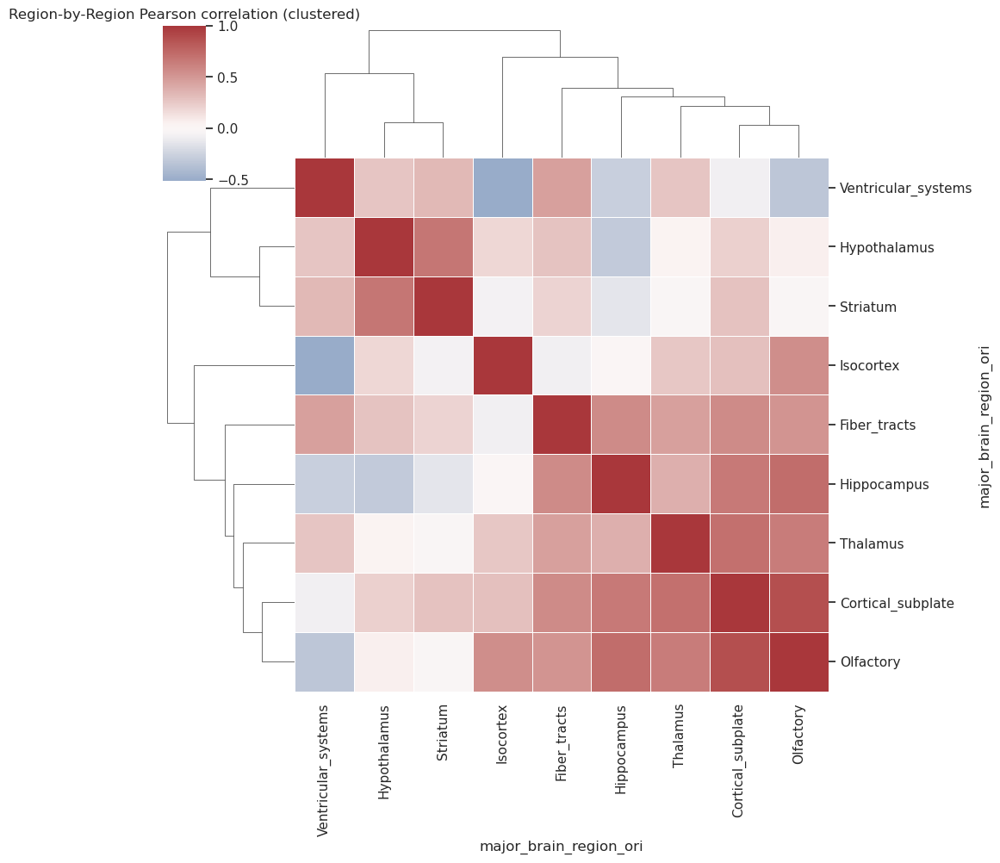

In [67]:
X = factor_adata.X
expr_df = pd.DataFrame(X,
                       index=factor_adata.obs['major_brain_region_ori'].astype(str),
                       columns=factor_adata.var_names)
region_means = expr_df.groupby(level=0).mean() 
region_corr_pearson = region_means.T.corr(method='pearson') 
region_corr_spearman = region_means.T.corr(method='spearman')


sns.set(context='notebook', style='white')
g = sns.clustermap(region_corr_pearson,
                   cmap='vlag', center=0,
                   linewidths=0.5, figsize=(10, 10))
plt.title('Region-by-Region Pearson correlation (clustered)')
plt.show()


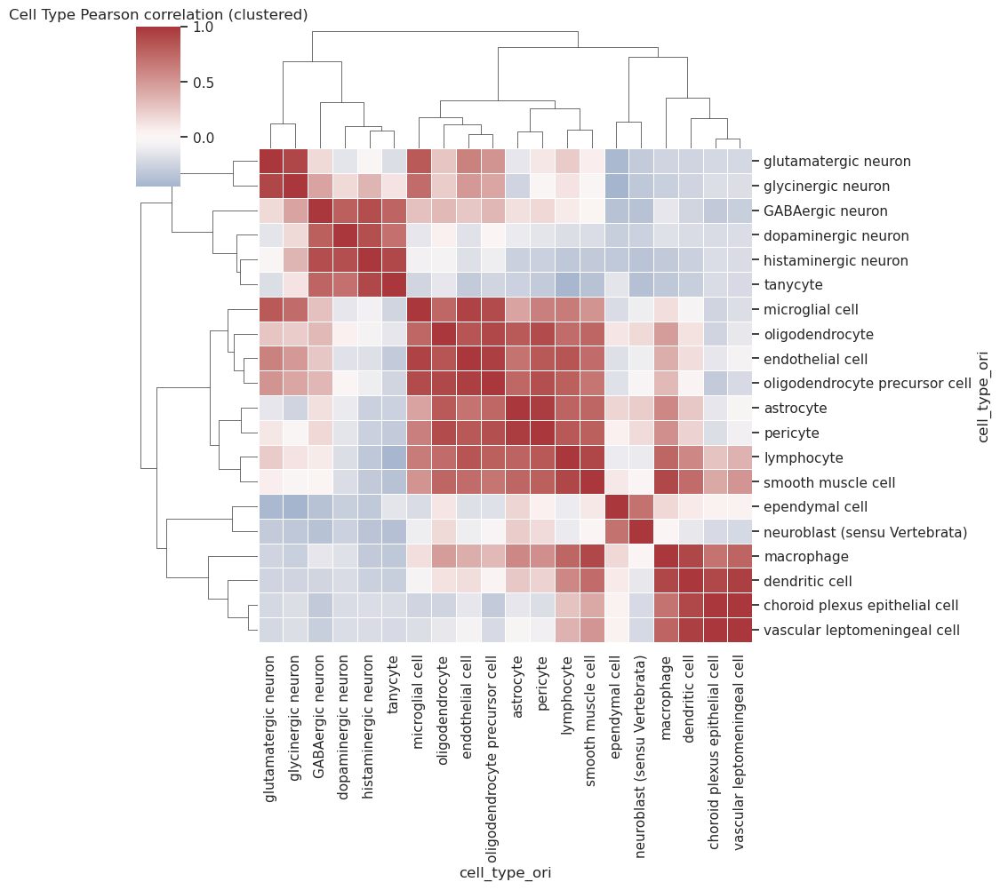

In [39]:
X = factor_adata.X
expr_df = pd.DataFrame(X,
                       index=factor_adata.obs['cell_type_ori'].astype(str),
                       columns=factor_adata.var_names)
region_means = expr_df.groupby(level=0).mean() 
region_means = region_means.loc[region_means.sum(axis=1) > 0]
corr_pearson = region_means.T.corr(method='pearson') 
corr_spearman = region_means.T.corr(method='spearman')


sns.set(context='notebook', style='white')
g = sns.clustermap(corr_pearson,
                   cmap='vlag', center=0,
                   linewidths=0.5, figsize=(10, 10))
plt.title('Cell Type Pearson correlation (clustered)')
plt.show()


### 7. Prediction of brain regions from latent factors

We will run simple Random forest model to find whether we can predict brain regions from latent factors or not.

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

In [41]:
X = factor_adata.X  
y = factor_adata.obs["major_brain_region_ori"].values
le = LabelEncoder()
y_enc = le.fit_transform(y)

In [42]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc, test_size=0.2, random_state=42, stratify=y_enc
)

In [54]:
rf = RandomForestClassifier(
    n_estimators=300,
#    max_depth=None,
    n_jobs=-1,
    random_state=42
)

rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=300, n_jobs=-1, random_state=42)

In [55]:
# Evaluation
y_pred = rf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=le.classes_))

Accuracy: 0.35260759493670885
                     precision    recall  f1-score   support

  Cortical_subplate       0.16      0.06      0.09       587
       Fiber_tracts       0.22      0.06      0.09      1210
        Hippocampus       0.41      0.10      0.16      1420
       Hypothalamus       0.37      0.22      0.27       974
          Isocortex       0.72      0.56      0.63      2663
          Olfactory       0.13      0.05      0.07       384
           Striatum       0.35      0.19      0.25       507
           Thalamus       0.24      0.79      0.37      1793
Ventricular_systems       0.16      0.04      0.07       337

           accuracy                           0.35      9875
          macro avg       0.31      0.23      0.22      9875
       weighted avg       0.40      0.35      0.32      9875



In [52]:
from sklearn.metrics import roc_auc_score

y_proba = rf.predict_proba(X_test)

auc_macro = roc_auc_score(
    y_test,
    y_proba,
    multi_class="ovr",
    average="macro"
)

auc_weighted = roc_auc_score(
    y_test,
    y_proba,
    multi_class="ovr",
    average="weighted"
)

print("ROC-AUC (macro):   ", auc_macro)
print("ROC-AUC (weighted):", auc_weighted)

ROC-AUC (macro):    0.6591434811214135
ROC-AUC (weighted): 0.6939463020594471


In [53]:
from sklearn.preprocessing import label_binarize

classes = np.unique(y_test)
y_test_bin = label_binarize(y_test, classes=classes)

per_class_auc = roc_auc_score(
    y_test_bin,
    y_proba,
    average=None
)

for cls, auc in zip(le.classes_, per_class_auc):
    print(f"{cls}: AUC = {auc:.3f}")


Cortical_subplate: AUC = 0.596
Fiber_tracts: AUC = 0.665
Hippocampus: AUC = 0.695
Hypothalamus: AUC = 0.641
Isocortex: AUC = 0.819
Olfactory: AUC = 0.570
Striatum: AUC = 0.649
Thalamus: AUC = 0.632
Ventricular_systems: AUC = 0.666


Note: nice and expected, isocortext has a unique signal

### sanity check (shuffle and re-train)


In [59]:
y_train_shuffled = y_train.copy()
rng = np.random.default_rng(42)
rng.shuffle(y_train_shuffled)
rf_shuffled = RandomForestClassifier(
    n_estimators=300,
    n_jobs=-1,
    random_state=42
)

rf_shuffled.fit(X_train, y_train_shuffled)

RandomForestClassifier(n_estimators=300, n_jobs=-1, random_state=42)

In [60]:
from sklearn.metrics import accuracy_score, roc_auc_score

y_pred_shuf = rf_shuffled.predict(X_test)
y_proba_shuf = rf_shuffled.predict_proba(X_test)

acc_shuf = accuracy_score(y_test, y_pred_shuf)

auc_macro_shuf = roc_auc_score(
    y_test,
    y_proba_shuf,
    multi_class="ovr",
    average="macro"
)

auc_weighted_shuf = roc_auc_score(
    y_test,
    y_proba_shuf,
    multi_class="ovr",
    average="weighted"
)

print("Shuffled accuracy:", acc_shuf)
print("Shuffled AUC (macro):", auc_macro_shuf)
print("Shuffled AUC (weighted):", auc_weighted_shuf)


Shuffled accuracy: 0.15848101265822784
Shuffled AUC (macro): 0.5112363825087648
Shuffled AUC (weighted): 0.5062948981046312


In [61]:
auc_macros = []

for seed in range(10):
    y_shuf = y_train.copy()
    np.random.default_rng(seed).shuffle(y_shuf)

    rf.fit(X_train, y_shuf)
    y_proba = rf.predict_proba(X_test)

    auc = roc_auc_score(
        y_test,
        y_proba,
        multi_class="ovr",
        average="macro"
    )
    auc_macros.append(auc)

print("Shuffled AUC mean ± std:",
      np.mean(auc_macros), np.std(auc_macros))


Shuffled AUC mean ± std: 0.5112331968653164 0.002021042442310331


----

## Dump area (UMAP)

In [168]:
from plotnine import *

sc.pp.neighbors(factor_adata, use_rep="X")
sc.tl.umap(factor_adata, min_dist=0.4)

In [169]:
factor_adata = factor_adata[~factor_adata.obs["major_brain_region_ori"].isna(), :]

In [170]:
umap_data = pd.DataFrame(
    factor_adata.obsm["X_umap"],
    index=factor_adata.obs_names,
    columns=["UMAP1", "UMAP2"],
).assign(batch=factor_adata.obs["major_brain_region_ori"])
umap_data = umap_data.sample(frac=1, replace=False)


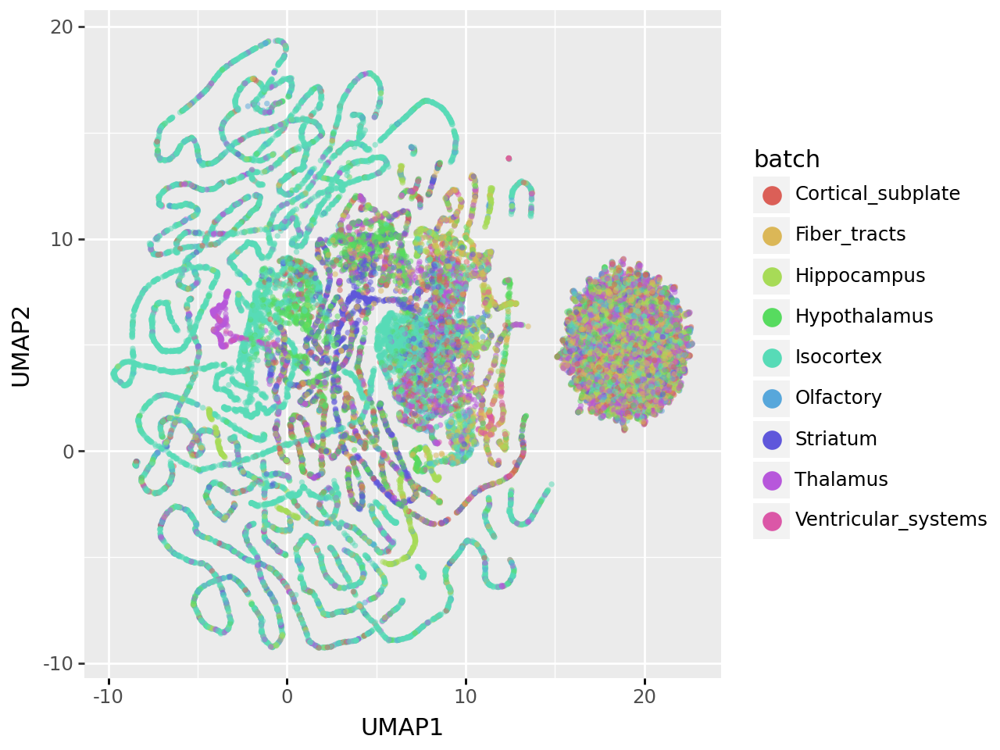

In [171]:

(
    ggplot(umap_data, aes(x="UMAP1", y="UMAP2", fill="batch"))
    + geom_point(
        stroke=0,
        alpha=0.5,
    )
    + guides(fill=guide_legend(override_aes={"size": 5, "alpha": 1}))
)